# Cluster analysis

In [146]:
import numpy as np
import pandas as pd

import math

from matplotlib import pyplot as plt
from matplotlib.lines import Line2D

import seaborn as sns

import branca.colormap as cmp

from scipy.spatial import ConvexHull

from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_score
from sklearn.preprocessing import StandardScaler
from sklearn import preprocessing
from sklearn.metrics import confusion_matrix
from sklearn.preprocessing import scale

from scipy.spatial.distance import pdist
from scipy.cluster.hierarchy import cophenet, linkage, dendrogram
from sklearn.cluster import AgglomerativeClustering

import folium
from folium.features import DivIcon
from shapely.geometry import shape
from branca.element import Template, MacroElement

from tqdm import tqdm

import ssl

ssl._create_default_https_context = ssl._create_unverified_context

In [147]:
import rpy2.robjects as robjects
import rpy2.robjects.packages as rpackages
from rpy2.robjects import pandas2ri
import rpy2.robjects.numpy2ri

rpy2.robjects.numpy2ri.activate()
rpy2.robjects.pandas2ri.activate()

In [148]:
# Defining the R script and loading the instance in Python
r = robjects.r['source']("RUtils/functions.R")

# Loading the function defined in R.
psline_fit = robjects.globalenv['psline_fit']
psline_predict = robjects.globalenv['psline_predict']

### Get imput values

In [149]:
plt.style.use('ggplot')

# loading previously saved data: df_covid
df_covid = pd.read_csv("datasets/dataCOVID_all.csv")
df_covid = df_covid.loc[(df_covid['date'] <= '2020-12-31')]

In [150]:
# available days & dimension
dates = df_covid['date'].unique()
m = len(dates)

# regions (geographical order)
reg = df_covid['region'].unique()
n = len(reg)

# x-axis
t = np.arange(0, m)
mn = m * n

# replace odd cases (deaths < 0)
df_covid['deaths'] = np.where(df_covid['deaths'] < 0, 0, df_covid['deaths'])

# clustering on P-spline coefficients
ndx = np.floor(m / 5)
deg = 3
nbx = ndx + deg

LMX = np.full((m, n,), .0)
LMX_hat = np.full((m, n,), .0)
COEF = np.full((int(nbx), n,), .0)

### Load R and perform P-spline smoothing on dataset

In [151]:
np.errstate(divide='ignore')
method = 3
alpha = 10 ** 3
for i, r in enumerate(reg):
    data_i = df_covid[df_covid['region'] == r]

    fit_i = psline_fit(t, data_i.deaths, np.log(data_i.population), method, alpha)

    COEF[:, i] = fit_i.rx2('coefficients')
    LMX_hat[:, i] = fit_i.rx2('logmortality').ravel()
    LMX[:, i] = np.log(data_i.deaths / data_i.population)


/Users/lorenzopratesi/Documents/development/PyCharm/DMO/CovidMining/venv/lib/python3.8/site-packages/pandas/core/arraylike.py:274: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


### Estimate using a Poisson approach and a selected number of covariates

In [152]:
def tpower(x, t, p):
    x_ = x[:, None]
    return (x_ - t) ** p * (x_ > t)

def bbase(x, xl, xr, ndx, deg):
    # Construct a B-spline basis of degree ’deg’
    dx = (xr - xl) / ndx
    num_of_knots = 2 * deg + int(ndx) + 1
    knots = np.linspace(start=xl - deg * dx, stop=xr + deg * dx, num=num_of_knots)
    P = tpower(x, knots, deg)
    n = P.shape[1]
    D = np.diff(np.eye(n), n=deg + 1).T / (math.gamma(deg + 1) * dx ** deg)
    B = (-1) ** (deg + 1) * P @ D.T
    return B, dx, knots

def bbase_derivative(x, deg, dx, knots):
    # derivative base
    knots1 = knots[1:-1]
    P = tpower(x, knots1, deg - 1)
    n = P.shape[1]
    D = np.diff(np.eye(n), n=deg).T / (math.gamma(deg) * dx ** (deg - 1))
    BB = ((-1) ** deg * P @ D.T) / dx
    D = np.diff(np.eye(BB.shape[1] + 1)).T
    C = BB @ D
    return C

def BsplineGrad(x, xl, xr, ndx, deg):
    B, dx, knots = bbase(x, xl, xr, ndx, deg)
    C = bbase_derivative(x, deg, dx, knots)
    return B, C

In [153]:
# For saving results
df_model = pd.DataFrame(columns=['region', 'population', 'deaths', 'fitted', 'coef', 'B', 'C', 'logmortality','log_exposure','lambda_hat', 'rate', 'rog'])

# for each region
for selregion in tqdm(reg):
    all_cases = df_covid['deaths'][df_covid['region'] == selregion]
    Totsel = df_covid['population'][df_covid['region'] == selregion].head(1).item()
    y = all_cases[:]

    # finding optimal lambda by out-of-sample
    lambdas = 10 ** np.arange(0, 6)
    nls = len(lambdas)
    pred_err = np.repeat(.0, nls)

    # selecting correct dimensions for evaluating forecast
    fore_window = 10
    h_ahead = 3
    m_low = m - fore_window - h_ahead + 1
    m_upp = m - h_ahead + 1
    m_fore = np.arange(m_low, m_upp)
    y_hat = np.repeat(.0, fore_window)
    y_true = y.tail(m_upp - m_low)

    for nl in np.arange(nls):
        lam = lambdas[nl]
        for i in np.arange(fore_window):
            x1 = t[:m_fore[i]]
            y1 = y[:m_fore[i]]

            fit_smo = psline_fit(x1, y1, np.log(Totsel), 3, lam)
            x_new = m_fore[i] + h_ahead
            eta_hat_new = psline_predict(fit_smo, x_new)
            y_hat[i] = np.exp(eta_hat_new) * Totsel

        # compute prediction error
        pred_err[nl] = np.sqrt(np.mean((y_hat - y_true) ** 2))

    # select optimal lambda
    pmin = np.argmin(pred_err)
    lambda_hat = lambdas[pmin]

    # Bspline basis
    xl = np.min(t)
    xr = np.max(t)
    xmin = xl - 0.01 * (xr - xl)
    xmax = xr + 0.01 * (xr - xl)
    ndx = np.floor(m / 5)
    deg = 3

    Bx, Cx = BsplineGrad(t, xmin, xmax, ndx, deg)

    # fitting P-splines
    fit_smo = psline_fit(t, y, np.log(Totsel), method, lambda_hat)

    # smooth response
    y_smo = psline_predict(fit_smo, prediction_type="response")
    ycum_smo = np.cumsum(y_smo)
    
    # logmortality
    logmortality = fit_smo.rx2('logmortality').ravel()
    log_exposure = np.log(y / Totsel)
    
    # rate of change
    rel_der = Cx @ fit_smo.rx2('coefficients')

    # current preval of new cases
    preval = np.mean(y_smo[-2:]) / Totsel
    rateofgrowth = rel_der[m - 1]

    # append the results in the model dataframe
    df_model.loc[len(df_model)] = [selregion, Totsel, y.values, y_smo, fit_smo.rx2('coefficients'), Bx, Cx,logmortality, log_exposure, lambda_hat, preval.item(), rateofgrowth]
    
print("End of modelling for all regions")

100%|██████████| 21/21 [01:07<00:00,  3.22s/it]

End of modelling for all regions


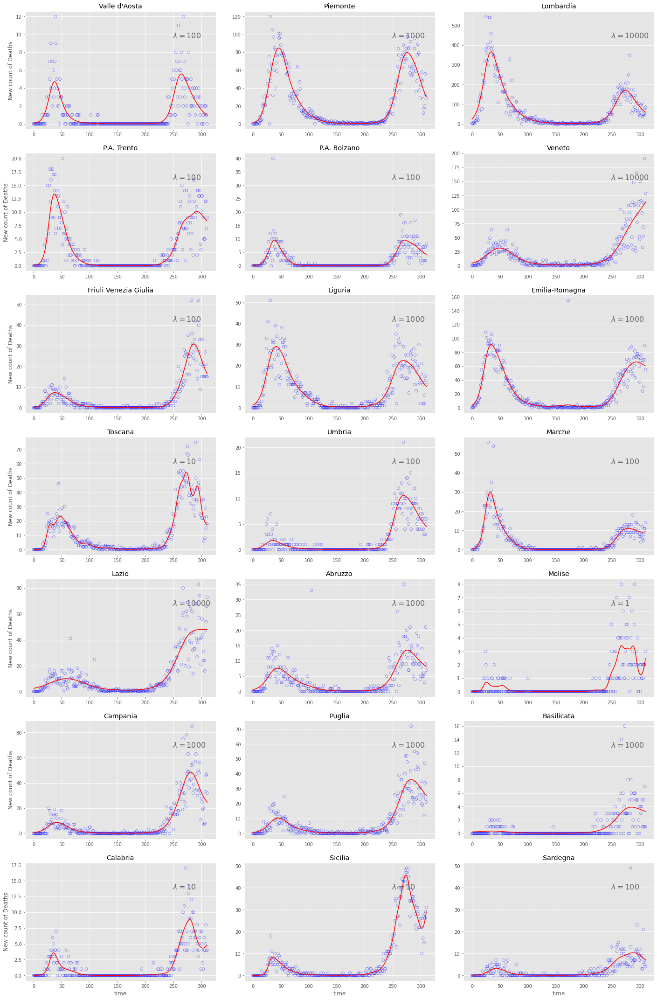

In [154]:
fig_row, fig_col = 7, 3
fig, axs = plt.subplots(fig_row, fig_col, figsize=(20, 30))
fig.tight_layout(pad=3.0)

r, c = -1, 0
for i in np.arange(n):
    if i % fig_col == 0:
        r += 1
        c = 0
    else:
        c += 1

    region = df_model.loc[i].region
    x = t
    y = df_model.loc[i].deaths
    y_fitted = df_model.loc[i].fitted
    lambda_hat = df_model.loc[i].lambda_hat

    axs[r, c].scatter(x, y, marker='o', facecolors='none', edgecolors='b', alpha=.7)
    axs[r, c].plot(x, y_fitted, 'r')
    axs[r, c].text(max(x) * .8, max(y) * .8, r'$\lambda={}$'.format(lambda_hat), fontsize=16, c="#636363")
    axs[r, c].set_title(region)

plt.setp(axs[-1, :], xlabel='time')
plt.setp(axs[:, 0], ylabel='New count of Deaths')
plt.show()

In [59]:
### K-means clustering
# Getting the scores for optimal number of clusters

def pd_val_to_matrix(df_item, nr, nc):
    matrix = np.full((nr, nc,), .0)

    for i, val in df_item.iteritems():
        matrix[:, i] = val 
    return matrix

In [60]:
# select data to cluster
#dati = COEF.T
spline_coeff = pd_val_to_matrix(df_model.coef, int(nbx), n)
dati = spline_coeff.T
#dati = COEF.T

Perform k-means index

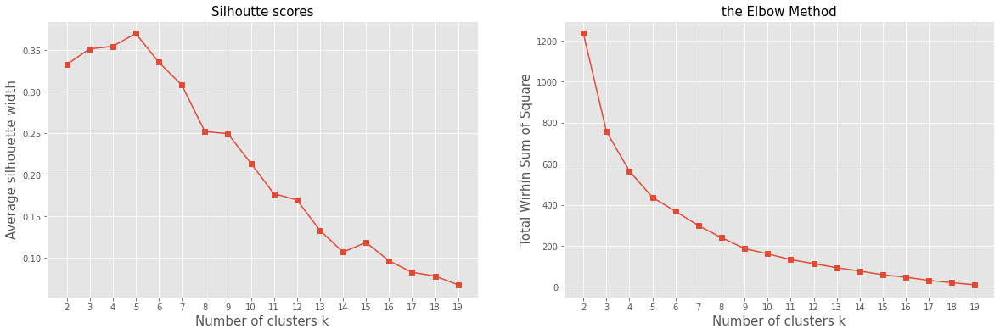

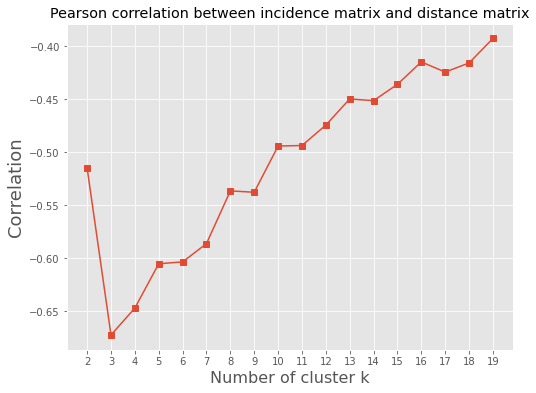

In [61]:
silhoutteValutations = [];
corrcoef = [];
SSE = []

K = np.arange(2, 20)
for k in K:
    kmeans = KMeans(n_clusters=k, random_state=123)
    kmeans.fit(dati)
    silhoutteValutations.append(silhouette_score(dati, kmeans.labels_, metric='euclidean'))
    SSE.append(kmeans.inertia_)

    clt_km = pd.DataFrame({'Regions': reg, 'Cluster': kmeans.labels_ + 1})
    pca = PCA(n_components=2)
    pca_col = pca.fit_transform(dati)

    clt_km['PC_1'] = pca_col[:, 0]
    clt_km['PC_2'] = pca_col[:, 1]

    # incidence matrix
    incidence_matrix = np.zeros((n, n))
    for idx, x in np.ndenumerate(incidence_matrix):
        if clt_km.loc[idx[0]].Cluster == clt_km.loc[idx[1]].Cluster:
            incidence_matrix[idx[0]][idx[1]] = 1

    # distance matrix
    distance_matrix = np.zeros((n, n))
    for idx, x in np.ndenumerate(incidence_matrix):
        point_1 = np.array((clt_km.loc[idx[0]].PC_1, clt_km.loc[idx[0]].PC_2))
        point_2 = np.array((clt_km.loc[idx[1]].PC_1, clt_km.loc[idx[1]].PC_2))
        distance_matrix[idx[0]][idx[1]] = np.linalg.norm(point_1 - point_2)

    # Pearson correlation
    incidence_matrix = incidence_matrix.ravel()
    distance_matrix = distance_matrix.ravel()
    corrcoef.append(np.corrcoef(incidence_matrix, distance_matrix)[0, 1])

figKM, axesKM = plt.subplots(nrows=1, ncols=2, figsize=(20, 6))
axesKM[0].plot(K, silhoutteValutations, marker='s')
axesKM[0].set_title("Silhoutte scores", fontsize=15)
axesKM[0].set_xlabel('Number of clusters k', fontsize=15)
axesKM[0].set_ylabel('Average silhouette width', fontsize=15)
axesKM[0].xaxis.set_ticks(np.arange(2, 20))

axesKM[1].plot(K, SSE, marker='s')
axesKM[1].set_title("the Elbow Method", fontsize=15)
axesKM[1].set_xlabel('Number of clusters k', fontsize=15)
axesKM[1].set_ylabel('Total Wirhin Sum of Square', fontsize=15)
axesKM[1].xaxis.set_ticks(np.arange(2, 20))

plt.figure(figsize=(8, 6))
plt.xlabel('Number of cluster k', fontsize=16)
plt.ylabel('Correlation', fontsize=18)
plt.title('Pearson correlation between incidence matrix and distance matrix')
plt.plot(K, corrcoef, marker='s')
plt.xticks(np.arange(2, 20))

plt.show()

In [62]:
# number of clusters
nc = 4
km_results = KMeans(n_clusters=nc, random_state=123)
km_results.fit(dati)
silhoutteValutations.append(silhouette_score(dati, km_results.labels_, metric='euclidean'))

clt_km = pd.DataFrame({'Regions': reg, 'Cluster': km_results.labels_ + 1})
pca = PCA(n_components=2)
pca_col = pca.fit_transform(dati)
clt_km['PC_1'] = pca_col[:, 0]
clt_km['PC_2'] = pca_col[:, 1]

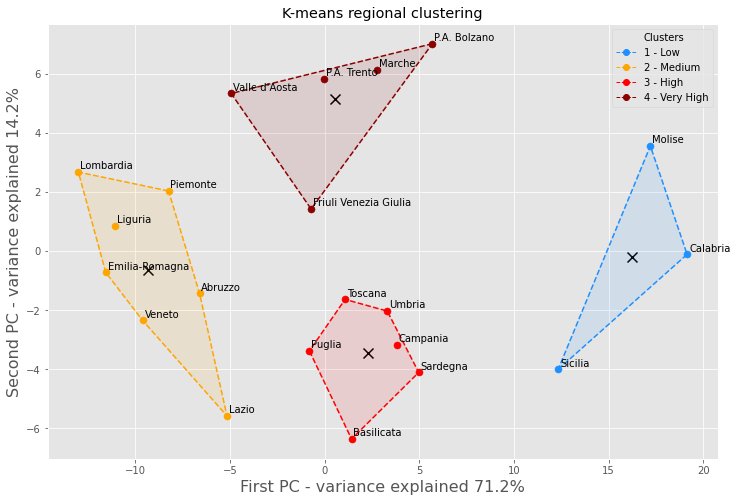

In [63]:
# Visualize regions over the first two components

col_km = ['red', 'orange', 'dodgerblue', 'darkred']
clus_label = ['Low', 'Medium', 'High', 'very high']
X = pca_col[:, 0]

y = km_results.labels_
centroids = KMeans(n_clusters=nc, random_state=123).fit(pca_col).cluster_centers_
fig, ax = plt.subplots(1, figsize=(12, 8))

for i in range(nc):
    points = pca_col[y == i]
    ax.scatter(points[:, 0], points[:, 1], s=50, c=col_km[i], label=f'{i + 1} - {clus_label[i]}')
    if len(points) > 2:
        hull = ConvexHull(points)
        vert = np.append(hull.vertices, hull.vertices[0])  # close the polygon by appending the first point at the end
        ax.plot(points[vert, 0], points[vert, 1], '--', c=col_km[i])
        ax.fill(points[vert, 0], points[vert, 1], c=col_km[i], alpha=0.1)

for index, row in clt_km.iterrows():
    ax.annotate(row['Regions'], (row['PC_1'] + .1, row['PC_2'] + .1))

ax.scatter(centroids[:, 0], centroids[:, 1], s=100, c='black', label='Centroids', marker='x')

#ax.legend()
custom_lines = [
    Line2D([0], [0], color='#E5E5E5', lw=0),
    Line2D([0], [0], color='dodgerblue', lw=1, linestyle='--', marker='o'),
    Line2D([0], [0], color='orange', lw=1, linestyle='--', marker='o'),
    Line2D([0], [0], color='red', lw=1, linestyle='--', marker='o'),
    Line2D([0], [0], color='darkred', lw=1, linestyle='--', marker='o')
]

ax.legend(custom_lines, ['Clusters', '1 - Low', '2 - Medium', '3 - High', '4 - Very High'])

plt.xlabel('First PC - variance explained ' + "{:.1%}".format(pca.explained_variance_ratio_[0]), fontsize=16)
plt.ylabel('Second PC - variance explained ' + "{:.1%}".format(pca.explained_variance_ratio_[1]), fontsize=16)

plt.title('K-means regional clustering')
plt.show()

In [64]:
logmortality = pd_val_to_matrix(df_model.logmortality, m, n)

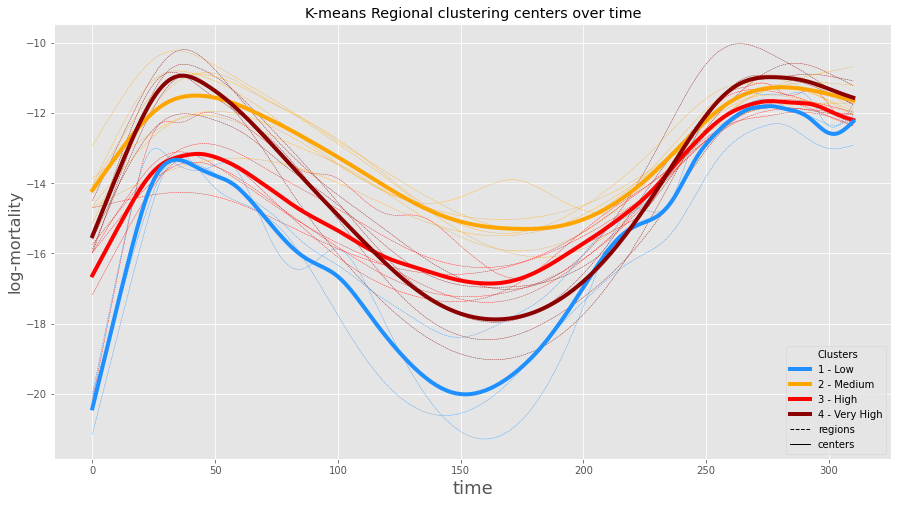

In [65]:
# compute cluster centers
B = df_model.B.loc[0]
Centers = [B @ km_results.cluster_centers_[i] for i in np.arange(nc)]
Centers = pd.DataFrame(np.array(Centers).T)

clist = np.array(col_km)[clt_km['Cluster'].values - 1]
#clist = np.where(clist == 'red', 'orange', np.where(clist == 'orange', 'red', clist))

fig, ax = plt.subplots(1, figsize=(15, 8))
ax.set_prop_cycle('color', clist)

#ax.plot(t, y, linewidth=1, linestyle="--", alpha=.3)
ax.plot(t, logmortality, linestyle="--", linewidth=.4, alpha=1)

ax.set_prop_cycle('color', col_km)

ax.plot(Centers, linewidth=4)

plt.xlabel('time', fontsize=18)
plt.ylabel('log-mortality', fontsize=16)

plt.title('K-means Regional clustering centers over time')

custom_lines = [
    Line2D([0], [0], color='#E5E5E5', lw=0),
    Line2D([0], [0], color='dodgerblue', lw=4),
    Line2D([0], [0], color='orange', lw=4),
    Line2D([0], [0], color='red', lw=4),
    Line2D([0], [0], color='darkred', lw=4),
    Line2D([0], [0], color='black', lw=1, linestyle='--'),
    Line2D([0], [0], color='black', lw=1)
]

ax.legend(custom_lines, ['Clusters', '1 - Low', '2 - Medium', '3 - High', '4 - Very High', 'regions', 'centers'])

plt.show()


In [66]:
B = df_model.B.loc[0]

In [67]:
nb = B.shape[1]

Inb = np.eye(nb)
Im = np.eye(m)
In = np.eye(n)

ones_m = np.full((m, 1,), 1)
ones_n = np.full((n, 1,), 1)
zeros_m = np.full((m, 1,), 0)

In [68]:
# exposure in a matrix and vectorized
e = df_covid['population']
E = np.full((m, n,), e.unique())

In [69]:
# design matrix for the baseline
Xeta0 = np.kron(ones_n, B)

In [70]:
df_covid.columns

Index(['region', 'date', 'population', 'pop65', 'density', 'nursehome',
       'deaths', 'cases', 'swabs', 'delayepi', 'time', 'gdpcap', 'icu',
       'icupch', 'positives', 'households'],
      dtype='object')

In [71]:
# design matrix for the covariates
col = ['icupch', 'gdpcap', 'delayepi', 'pop65', 'swabs', 'positives']
col = ['pop65', 'nursehome', 'swabs', 'delayepi', 'gdpcap', 'icu', 'icupch', 'positives', 'households']
Xz = pd.DataFrame(scale(pd.DataFrame(df_covid[col])), columns=col)
nz = Xz.shape[1]

# clusters
clusters = clt_km.Cluster

In [72]:
# design matrix for the cluster curves
Xgamma = np.full((m * n, (nc - 1) * nb,), 0, dtype=B.dtype)
for i in range(n):
    clu_i = clusters[i]
    if clu_i != 1:
        wr = np.arange(m) + (i - 1) * m
        wc = np.arange(nb) + (clu_i - 2) * nb
        Xgamma[np.ix_(wr, wc)] = B

# full design matrix
X = np.concatenate((Xeta0, Xgamma, Xz), axis=1)
print("Possibile identificability issue:")
print(f"- number of columns of X: {X.shape[1]}")
print(f"- rank of X: {np.linalg.matrix_rank(X)}")

Possibile identificability issue:
- number of columns of X: 269
- rank of X: 269


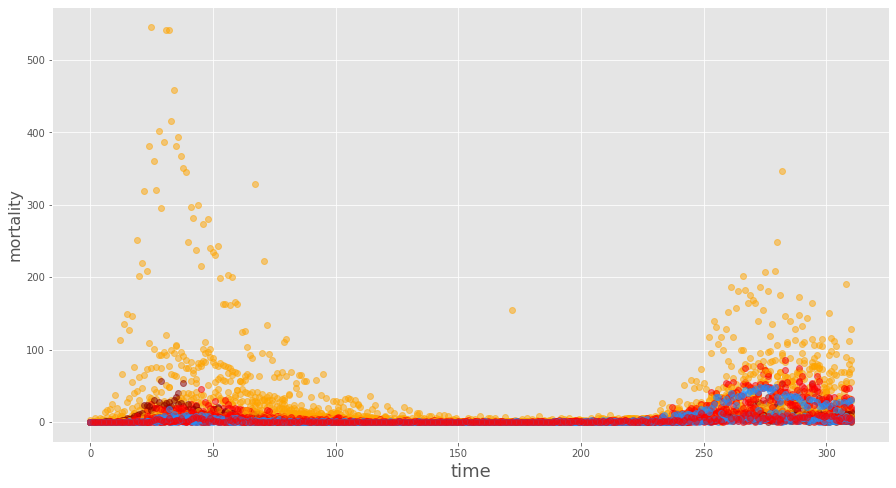

In [73]:

#counts
y = df_covid['deaths']
Y = np.zeros((m, n))
for i, r in enumerate(reg):
    Y[:, i] = y[df_covid['region'] == r]

fig, ax = plt.subplots(1, figsize=(15, 8))
ax.set_prop_cycle('color', clist)

ax.plot(t, Y, marker='o', linestyle="--", linewidth=0, alpha=.5)

plt.xlabel('time', fontsize=18)
plt.ylabel('mortality', fontsize=16)
plt.show()

In [74]:
# coefficients positions
p_eta0 = np.arange(nb)
p_gamma = np.arange(nb * (nc - 1)) + nb
p_beta = np.arange(nz) + (nb * (nc - 1)) + nb

In [75]:
# penalty stuff
d = 2
D = np.diff(Inb, n=d).T
tDD = D.T @ D

# eventual ridge penalty
Pr = 1e-5 * np.eye(X.shape[1])

In [77]:
# selecting with a Poisson approach
lambdas_eta0 = 10 ** np.arange(0, 5)
nl_eta0 = len(lambdas_eta0)

lambdas_gamma = np.insert(lambdas_eta0, 0, 0, axis=0)
nl_gamma = len(lambdas_gamma)
AICs = np.zeros((nl_eta0, nl_gamma))
BICs = np.zeros((nl_eta0, nl_gamma))
EDs = np.zeros((nl_eta0, nl_gamma))
DEVs = np.zeros((nl_eta0, nl_gamma))

ETAs = np.empty((m * n, nl_eta0, nl_gamma))
ALPHAs = np.empty((X.shape[1], nl_eta0, nl_gamma))

for l1 in tqdm(np.arange(nl_eta0)):
    for l2 in np.arange(nl_gamma):
        Peta0 = lambdas_eta0[l1] * tDD
        Pgamma0 = lambdas_gamma[l2] * tDD
        Pgamma = np.kron(np.eye(nc - 1), Pgamma0)
        P = np.zeros((X.shape[1], X.shape[1]), dtype=Pgamma.dtype)
        P[:nb, :nb] = Peta0
        P[np.ix_(p_gamma, p_gamma)] = Pgamma
        eta = np.log((y + 1) / (e + 2))

        for it in range(len(reg)):
            mu = e * np.exp(eta.ravel())
            w = np.array([mu]).T
            z = np.array((y - mu) / mu + eta.ravel())
            tXWX = X.T @ (w * X)
            tXWXpP = tXWX + P + Pr
            tXWz = X.T @ (w.T * z).T

            ##
            alphas = np.linalg.solve(tXWXpP, tXWz)
            eta_old = np.array(eta)
            eta = X @ alphas
            deta = np.max(np.abs(eta - eta_old) / np.abs(eta))
            if deta <= 10 ** (-4) and it >= 4:
                break

        H = np.linalg.solve(tXWXpP, tXWX)
        ED = np.trace(H)
        yy = y[:]

        yy[y == 0] = 10 ** (-8)

        dev1 = y * np.log(yy / mu)
        dev2 = y - mu
        DEV = 2 * np.sum(dev1 - dev2)
        BICs[l1, l2] = DEV + np.log(m * n) * ED
        AICs[l1, l2] = DEV + 2 * ED
        EDs[l1, l2] = ED
        DEVs[l1, l2] = DEV
        ETAs[:, l1, l2] = eta.T
        ALPHAs[:, l1, l2] = alphas.T

print("End of modelling")

100%|██████████| 5/5 [00:31<00:00,  6.40s/it]

End of modelling


In [78]:
# select lambdas by minimizing BIC
pmin = np.unravel_index(np.argmin(BICs, axis=None), BICs.shape)
dev_hat = DEVs[pmin[0], pmin[1]]
ed_hat = EDs[pmin[0], pmin[1]]
aic_hat = AICs[pmin[0], pmin[1]]
bic_hat = BICs[pmin[0], pmin[1]]
## print deviance, ED and BIC
print([dev_hat, ed_hat, bic_hat])

# fitted object
alphas_hat = ALPHAs[:, pmin[0], pmin[1]]
eta_hat = ETAs[:, pmin[0], pmin[1]]
mu_hat = [e] * np.exp(eta_hat)
ETA_hat = eta_hat.reshape(m, n)
MU_hat = mu_hat.reshape(m, n)
eta0_hat = B @ alphas_hat[p_eta0]
alphas_gamma_hat = alphas_hat[p_gamma]
Bgamma = np.kron(np.eye(nc - 1), B)
gamma_hat = Bgamma @ alphas_gamma_hat
GAMMA_hat = gamma_hat.reshape(m, nc - 1)
beta_hat = alphas_hat[p_beta]

# standard errors
tXWX = X.T @ (np.transpose([MU_hat.ravel()]) * X)
Peta0 = lambdas_eta0[pmin[0]] * tDD
Pgamma0 = lambdas_gamma[pmin[1]] * tDD
Pgamma = np.kron(np.eye(nc - 1), Pgamma0)
P = np.zeros((X.shape[1], X.shape[1]))
P[np.ix_(p_eta0, p_eta0)] = Peta0
P[np.ix_(p_gamma, p_gamma)] = Pgamma
V = np.linalg.inv(tXWX + P)
se_alphas = np.sqrt(np.diag(V))

[18129.83866324356, 105.63581103630108, 19057.77693962916]


In [79]:
# standard errors eta
g_eta = X
V_etas = g_eta @ V @ g_eta.T
se_etas = np.sqrt(np.diag(V_etas))
se_ETA = se_etas.reshape(m, n)

# standard errors mu 
g_mu = np.diag(mu_hat.ravel()) @ X
V_mu = g_mu @ V @ g_mu.T
se_mu = np.sqrt(np.diag(V_mu))  ## se.eta * mu
se_MU = se_mu.reshape(m, n)

# mu_ita
Im = np.eye(m)
H = np.kron(ones_n.T, Im)
mu_ita = H @ mu_hat.ravel()
eta_ita = np.log(mu_ita) - np.log(H @ e)

# se.mu.ita (H * mu)
g_mu_ita = H @ np.diag(mu_hat.ravel()) @ X
V_mu_ita = g_mu_ita @ V @ g_mu_ita.T
se_mu_ita = np.sqrt(np.diag(V_mu_ita))

# se.eta.ita log(H*mu) - log(H*e)
g_eta_ita = np.diag(1 / (H @ mu_hat.ravel())) @ H @ np.diag(mu_hat.ravel()) @ X
V_eta_ita = g_eta_ita @ V @ g_eta_ita.T
se_eta_ita = np.sqrt(np.diag(V_eta_ita))

# se.eta0
V_eta0 = B @ np.diag(se_alphas[p_eta0]) @ B.T
se_eta0 = np.sqrt(np.diag(V_eta0))

## se.gamma
V_gamma = Bgamma @ np.diag(se_alphas[p_gamma]) @ Bgamma.T
se_gamma = np.sqrt(np.diag(V_gamma))
se_GAMMA = se_gamma.reshape(m, nc - 1)

# se.beta
se_beta = se_alphas[p_beta]

In [30]:
np.arange(current_slice.shape[1])

NameError: name 'current_slice' is not defined

In [80]:
# upper and lower bounds
eta0_low = eta0_hat - 2 * se_eta0
eta0_up = eta0_hat + 2 * se_eta0
GAMMA_low = GAMMA_hat - 2 * se_GAMMA
GAMMA_up = GAMMA_hat + 2 * se_GAMMA
beta_low = beta_hat - 2 * se_beta
beta_up = beta_hat + 2 * se_beta
ETA_up = ETA_hat + 2 * se_ETA
ETA_low = ETA_hat - 2 * se_ETA
MU_up = np.exp(ETA_hat + 2 * se_ETA) * E
MU_low = np.exp(ETA_hat - 2 * se_ETA) * E
mu_ita_up = mu_ita + 2 * se_mu_ita
mu_ita_low = mu_ita - 2 * se_mu_ita
eta_ita_up = eta_ita + 2 * se_eta_ita
eta_ita_low = eta_ita - 2 * se_eta_ita

In [ ]:
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.font_manager import FontProperties
from matplotlib.collections import LineCollection
from matplotlib.colors import ListedColormap
from mpl_toolkits.mplot3d.art3d import Line3DCollection
from matplotlib.cm import get_cmap
import matplotlib as mpl

mpl.rcParams.update(mpl.rcParamsDefault)

# create the figure
fig = plt.figure(figsize=(20, 9))

ax = fig.add_subplot(111, projection='3d')
fig.patch.set_alpha(1)

# get the cmap to use
cmap = get_cmap('RdYlGn')

# get the slice
current_slice = Y
index_names = reg
index_dates = pd.date_range(datetime.strptime(min(dates), '%Y-%m-%d'), datetime.strptime(max(dates), '%Y-%m-%d'), freq='d')

# list holding the lines
lines = []

# for each index...
for i in range(n):

    # get the coordinates
    x = np.array(np.arange(current_slice.shape[0]))
    y = np.tile(i, current_slice.shape[0])
    z = np.array(current_slice[:, i])

    # crete points and segments to color
    points = np.array([x, y, z]).T.reshape(-1, 1, 3)
    segments = np.concatenate([points[:-1], points[1:]], axis=1)

    # Create a continuous norm to map from data points to colors
    norm = plt.Normalize(-0.19, 0.19)
    lc = Line3DCollection(segments, norm=norm, zorder=current_slice.shape[1]-i)

    # Set the values used for colormapping
    #lc.set_array(z)
    lc.set_linewidth(2)
    lc.set_color(clist[i])
    lc.set_label(index_names[i])
    lines.append(ax.add_collection(lc))

# add the grids
#ax.legend(loc='center right', bbox_to_anchor=(1.1, 0.46), fancybox=True, facecolor=(.95,.95,.95,1), framealpha=1, shadow=False, frameon=True, ncol=1, columnspacing=0, prop={'family': 'DejaVu Sans Mono'})
ax.set_zlabel('Deaths', labelpad=10)
ax.set_zlim(0, np.max(current_slice))
#ax.set_zticklabels([' '* 3 + '{:.0%}'.format(val) for val in ax.get_zticks()], fontdict={'verticalalignment': 'center', 'horizontalalignment': 'center'})
ax.set_xlabel('Date', labelpad=30)
ax.set_xlim(0, current_slice.shape[0]-1)

xticklabels = [index_dates[int(val)].strftime('%m/%y') for val in ax.get_xticks()[:-1]] + ['']
ax.set_xticklabels(xticklabels, rotation=0, fontdict={'verticalalignment': 'top', 'horizontalalignment': 'center'})
ax.set_yticks(np.arange(current_slice.shape[1]))

yticklabels = [index_names[i] for i in range(current_slice.shape[1])]
ax.set_yticklabels(yticklabels, rotation=-15, fontdict={'verticalalignment': 'center', 'horizontalalignment': 'left'})
#ax.w_xaxis.set_pane_color((0, 0, 0, 1.0))
#ax.w_yaxis.set_pane_color((0, 0, 0, 1.0))
#ax.w_zaxis.set_pane_color((0, 0, 0, 1.0))
ax.view_init(25, -40)

# ------------------------------------------------------------------
x_scale=1.8
y_scale=1
z_scale=1

scale=np.diag([x_scale, y_scale, z_scale, 1.0])
scale=scale*(1.0/scale.max())
scale[3,3]=1.0

def short_proj():
    return np.dot(Axes3D.get_proj(ax), scale)

ax.get_proj=short_proj

fig.subplots_adjust(left=0, right=1, bottom=0, top=1)
# ------------------------------------------------------------------
plt.tick_params(axis='y', which='major', labelsize=5)

# show the plot
plt.show()

<ipython-input-96-fd974db6016f>:75: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels([index_dates[int(val)].strftime('%m/%y') for val in ax.get_xticks()[:-1]] + [''], rotation=0, fontdict={'verticalalignment': 'top', 'horizontalalignment': 'center'})


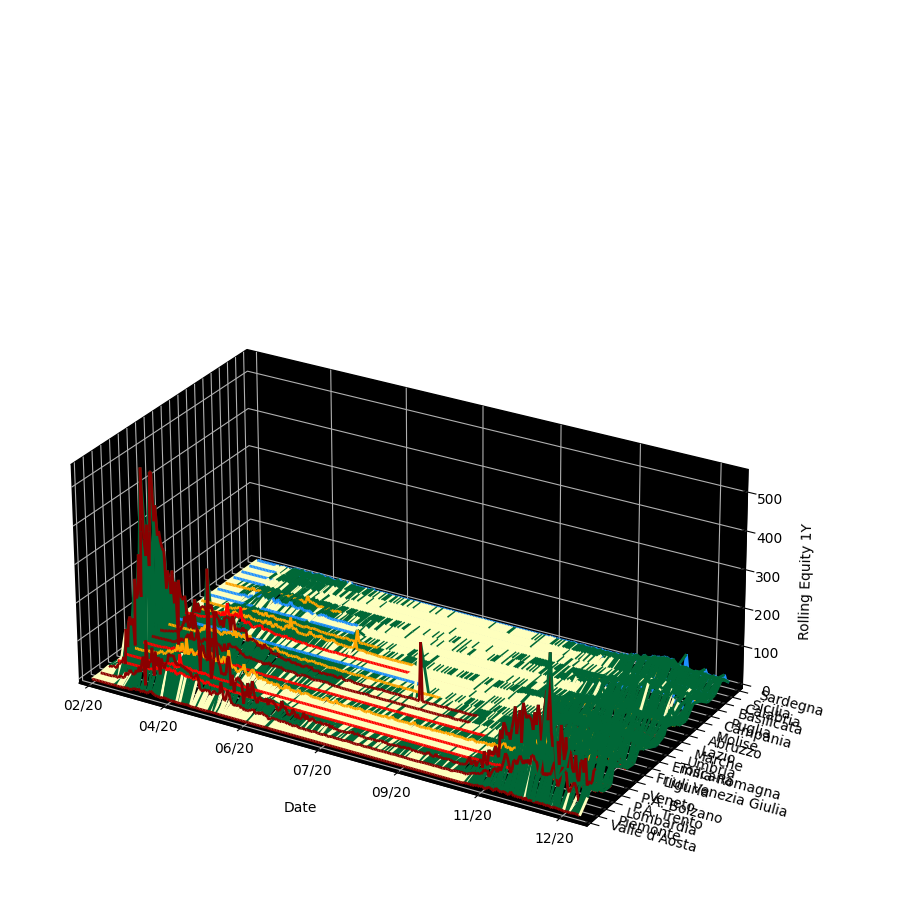

In [96]:
# create the figure
fig = plt.figure(figsize=(14.4, 9))
ax = fig.add_subplot(111, projection='3d')
fig.patch.set_alpha(1)

# get the cmap to use
cmap = get_cmap('RdYlGn')

# get the slice
# current_slice = indexes_rolling.values[:261, :]
current_slice = Y
index_names = reg
index_dates = pd.date_range(datetime.strptime(min(dates), '%Y-%m-%d'), datetime.strptime(max(dates), '%Y-%m-%d'), freq='d')


# list holding the lines
lines = []

# for each index...
for i in range(n):

    # get the coordinates
    x = np.array(np.arange(current_slice.shape[0]))
    y = np.tile(i, current_slice.shape[0])
    z = np.array(current_slice[:, i])

    # crete points and segments to color
    points = np.array([x, y, z]).T.reshape(-1, 1, 3)
    segments = np.concatenate([points[:-1], points[1:]], axis=1)

    # Create a continuous norm to map from data points to colors
    norm = plt.Normalize(-0.19, 0.19)
    lc = Line3DCollection(segments, cmap=cmap, norm=norm, zorder=current_slice.shape[1]-i)

    # Set the values used for colormapping
    #lc.set_array(z)
    lc.set_linewidth(2)
    lc.set_color(clist[i])
    lc.set_label(index_names[i])
    lines.append(ax.add_collection(lc))

# list holding the mesh lines
mesh_lines = []

# for each day...
for j in range(current_slice.shape[0]):

    if j % 1 == 0:
        
        # get the coordinates
        x = np.tile(j, current_slice.shape[1])
        y = np.arange(current_slice.shape[1])
        z = np.array(current_slice[j, :])

        # crete points and segments to color
        points = np.array([x, y, z]).T.reshape(-1, 1, 3)
        segments = np.concatenate([points[:-1], points[1:]], axis=1)

        # Create a continuous norm to map from data points to colors
        norm = plt.Normalize(-0.19, 0.19)
        lc = Line3DCollection(segments, cmap=cmap, norm=norm)

        # Set the values used for colormapping
        lc.set_array(z)
        lc.set_linewidth(2)
        mesh_lines.append(ax.add_collection(lc))
    
# add the grids
#ax.legend(loc='center right', bbox_to_anchor=(1.1, 0.46), fancybox=True, facecolor=(.95,.95,.95,1), framealpha=1, shadow=False, frameon=True, ncol=1, columnspacing=0, prop={'family': 'DejaVu Sans Mono'})
ax.set_zlabel('Rolling Equity 1Y', labelpad=10)
ax.set_zlim(0, np.max(current_slice))
#ax.set_zticklabels([' '* 3 + '{:.0%}'.format(val) for val in ax.get_zticks()], fontdict={'verticalalignment': 'center', 'horizontalalignment': 'center'})
ax.set_xlabel('Date', labelpad=30)
ax.set_xlim(0, current_slice.shape[0]-1)
ax.set_xticklabels([index_dates[int(val)].strftime('%m/%y') for val in ax.get_xticks()[:-1]] + [''], rotation=0, fontdict={'verticalalignment': 'top', 'horizontalalignment': 'center'})
ax.set_yticks(np.arange(current_slice.shape[1]))
ax.set_yticklabels([index_names[i]for i in range(current_slice.shape[1])], rotation=-15, fontdict={'verticalalignment': 'center', 'horizontalalignment': 'left'})
ax.w_xaxis.set_pane_color((0, 0, 0, 1.0))
ax.w_yaxis.set_pane_color((0, 0, 0, 1.0))
ax.w_zaxis.set_pane_color((0, 0, 0, 1.0))
ax.view_init(25, -60)

# ------------------------------------------------------------------
x_scale=1.8
y_scale=1
z_scale=1

scale=np.diag([x_scale, y_scale, z_scale, 1.0])
scale=scale*(1.0/scale.max())
scale[3,3]=1.0

def short_proj():
    return np.dot(Axes3D.get_proj(ax), scale)

ax.get_proj=short_proj

fig.subplots_adjust(left=0, right=1, bottom=0, top=1)
# ------------------------------------------------------------------

# show the plot
plt.show()

In [81]:
df_coeff = pd.DataFrame({'beta_hat': beta_hat, 'beta_low': beta_low, 'beta_up': beta_up}, index=col).round(decimals=2)
df_coeff["95% CI"] = "(" + df_coeff["beta_low"].astype(str) + "; " + df_coeff["beta_up"].astype(str) + ")"
df_coeff = df_coeff[['beta_hat', '95% CI']]
df_coeff

,beta_hat,95% CI
pop65,0.09,(0.07; 0.1)
nursehome,0.31,(0.28; 0.33)
swabs,-0.33,(-0.35; -0.31)
delayepi,-0.10,(-0.13; -0.07)
gdpcap,0.10,(0.07; 0.13)
icu,-0.06,(-0.07; -0.05)
icupch,0.78,(0.75; 0.81)
positives,0.27,(0.25; 0.29)
households,-0.08,(-0.1; -0.06)


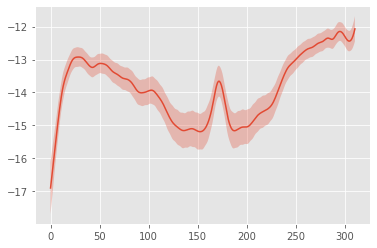

In [82]:
# plotting reference curve
xx = np.append(t, np.flip(t))
yy = np.append(eta0_low, np.flip(eta0_up))
plt.fill(xx, yy, alpha=0.3)
plt.plot(t, eta0_hat)
plt.show()

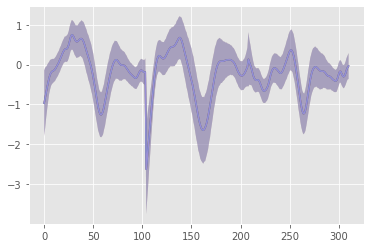

In [83]:
# plotting cluster curves
for i in range(GAMMA_hat.shape[1]):
    i = 0
    yy = np.append(GAMMA_low[:, i], np.flip(GAMMA_up[:, i]))
    plt.fill(xx, yy, alpha=0.3)
    plt.plot(t, GAMMA_hat[:, i])


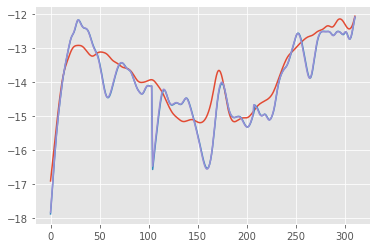

In [84]:
plt.plot(t, eta0_hat)
plt.plot(t, eta0_hat + GAMMA_hat[:, 0])
plt.plot(t, eta0_hat + GAMMA_hat[:, 1])

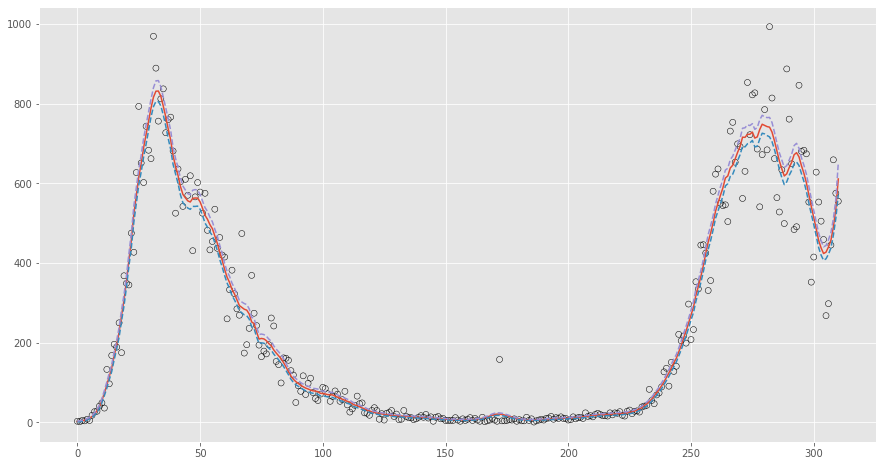

In [85]:
y_ita = H @ y
lmx_ita = np.log(y_ita) - np.log(H @ e)

fig, ax = plt.subplots(1, figsize=(15, 8))
ax.scatter(t, y_ita, marker='o', facecolors='none', edgecolors='black')

ax.plot(t, mu_ita)
ax.plot(t, mu_ita_low, '--')
ax.plot(t, mu_ita_up, '--')

plt.show()

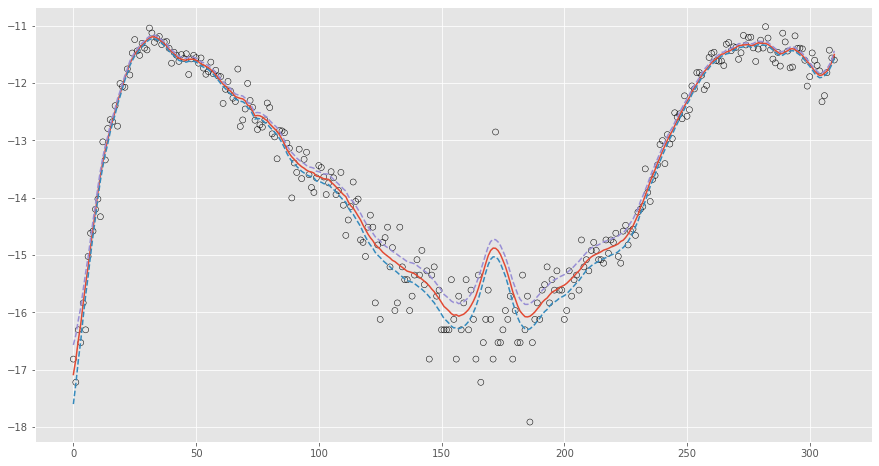

In [86]:
fig, ax = plt.subplots(1, figsize=(15, 8))

plt.scatter(t, lmx_ita, marker='o', facecolors='none', edgecolors='black')
plt.plot(t, eta_ita)
plt.plot(t, eta_ita_low, '--')
plt.plot(t, eta_ita_up, '--')

plt.show()

# Visualize clusters over Italy

Get geomap information

In [31]:
url = "https://raw.githubusercontent.com/pcm-dpc/COVID-19/master/dati-json/dpc-covid19-ita-regioni.json"
df_regioni = pd.read_json(url)

In [32]:
import urllib.request, json

with urllib.request.urlopen(
        "https://gist.githubusercontent.com/datajournalism-it/f1abb68e718b54f6a0fe/raw/23636ff76534439b52b87a67e766b11fa7373aa9/regioni-con-trento-bolzano.geojson") as url:
    geojson_italy_provinces = json.loads(url.read().decode())

In [33]:
for item in geojson_italy_provinces["features"]:
    item['regioni'] = item['properties']['Regione']

### Visualize K-means cluters

In [34]:
clt_km.iat[3, 0] = "Trento"
clt_km.iat[4, 0] = "Bolzano"
clt_km.iat[8, 0] = "Emilia Romagna"
clt_km.iat[18, 2] = clt_km.iat[18, 2] / 2

clt_km['PC_1'] = abs(clt_km['PC_1'])
min_max_scaler = preprocessing.MinMaxScaler()
clt_km['PC_1'] = min_max_scaler.fit_transform(clt_km['PC_1'].values.reshape(-1, 1))
clt_km['PC_1'] = np.where(clt_km['PC_1'] < .2, .2, clt_km['PC_1'])

In [35]:
step = cmp.StepColormap(
    col_km,
    vmin=0, vmax=4,
    index=[0, 1, 2, 3, 4],
    caption=' Colour transparency is proportional to regional value associated to the first PC.'
)

In [36]:
dt = clt_km.set_index('Regions')[['Cluster', 'PC_1']]

italy_map = folium.Map([43, 12], width=1000, height=1400, tiles='Mapbox Bright', zoom_start=5.5)
folium.GeoJson(
    geojson_italy_provinces,
    style_function=lambda feature: {
        'fillColor': step(dt.loc[feature['regioni']][0]),
        'color': 'black',
        'weight': 1,
        'dashArray': '5, 3',
        'fillOpacity': dt.loc[feature['regioni']][1],
    }
).add_to(italy_map)
#step.add_to(italy_map)  #adds colorscale or legend

for r in geojson_italy_provinces['features']:
    region = r['properties']['Regione']
    coord = shape(r['geometry']).centroid
    folium.map.Marker(location=[coord.y + .4, coord.x - .5], icon=DivIcon(
        icon_size=(150, 36),
        icon_anchor=(0, 0),
        html='<div style="font-size: 10pt; color:black">{}</div>'.format(str(region))
    )).add_to(italy_map)

with open('../resources/leggend_style.htm', 'r') as f:
    template = f.read()

macro = MacroElement()
macro._template = Template(template)

italy_map.get_root().add_child(macro)

italy_map

### Visualize Hierarchical cluters

In [54]:
clusters_hc.iat[3, 0] = "Trento"
clusters_hc.iat[4, 0] = "Bolzano"
clusters_hc.iat[8, 0] = "Emilia Romagna"
clusters_hc.iat[18, 2] = clusters_hc.iat[18, 2] / 2
clusters_hc.iat[9, 2] = .3

clusters_hc['PC_1'] = abs(clusters_hc['PC_1'])
min_max_scaler = preprocessing.MinMaxScaler()
clusters_hc['PC_1'] = min_max_scaler.fit_transform(clusters_hc['PC_1'].values.reshape(-1, 1))
clusters_hc['PC_1'] = np.where(clusters_hc['PC_1'] < .2, .3, clusters_hc['PC_1'])

In [55]:
step = cmp.StepColormap(
    col_hc,
    vmin=0, vmax=4,
    index=[0, 1, 2, 3, 4],
    caption=' Colour transparency is proportional to regional value associated to the first PC.'
)

In [56]:
dt = clusters_hc.set_index('Regions')[['Cluster', 'PC_1']]

italy_map = folium.Map([43, 12], width=1000, height=1400, tiles='Mapbox Bright', zoom_start=5.5)
folium.GeoJson(
    geojson_italy_provinces,
    style_function=lambda feature: {
        'fillColor': step(dt.loc[feature['regioni']][0]),
        'color': 'black',
        'weight': 1,
        'dashArray': '5, 3',
        'fillOpacity': dt.loc[feature['regioni']][1],
    }
).add_to(italy_map)
#step.add_to(italy_map)  #adds colorscale or legend

for r in geojson_italy_provinces['features']:
    region = r['properties']['Regione']
    coord = shape(r['geometry']).centroid
    folium.map.Marker(location=[coord.y + .4, coord.x - .5], icon=DivIcon(
        icon_size=(150, 36),
        icon_anchor=(0, 0),
        html='<div style="font-size: 10pt; color:black">{}</div>'.format(str(region))
    )).add_to(italy_map)

with open('../resources/leggend_style_hc.htm', 'r') as f:
    template = f.read()

macro = MacroElement()
macro._template = Template(template)

italy_map.get_root().add_child(macro)

italy_map